In [2]:
%matplotlib inline
from __future__ import print_function, unicode_literals
import sys, os
import datetime as dt
import seaborn as sns
import numpy as np
import matplotlib
from matplotlib import pyplot as plt

In [3]:
from pygaarst import raster
import pandas as pd
import geopandas as gp
from fiona.crs import from_string
import shapely.ops
from shapely.geometry import Point
from matplotlib.collections import PatchCollection
from descartes import PolygonPatch

In [1]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset

In [13]:
sns.set(rc={'image.cmap': 'gist_heat'})
sns.set(rc={'image.cmap': 'bone'})

sns.set_context("poster")

myfontsize = 20
font = {'family' : 'Calibri',
        'weight': 'bold',
        'size'   : myfontsize}
matplotlib.rc('font', **font)
matplotlib.axes.rcParams['axes.labelsize']=myfontsize-4
matplotlib.axes.rcParams['axes.titlesize']=myfontsize
cmap1 =  matplotlib.colors.ListedColormap(sns.xkcd_palette(['white', 'bright red']))
cmap2 =  matplotlib.colors.ListedColormap(sns.xkcd_palette(['white', 'neon green']))
cmap3 =  matplotlib.colors.ListedColormap(sns.xkcd_palette(['white', 'orange']))

In [31]:
gisdir = "/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/GISout/"
newviirspolydf = gp.GeoDataFrame.from_file(os.path.join(gisdir, 'WesternAKviirsspoly.shp'))

In [5]:
landsatpath = '/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/Landsat/L8 OLI_TIRS 20150706/'
lsscene = 'LC80730142015187LGN00'
landsat = raster.Landsatscene(os.path.join(landsatpath, lsscene))

In [6]:
productdir = '/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/rasterout/'

In [7]:
landsat.infix = '_clip'
rho7 = landsat.band7.reflectance
rho6 = landsat.band6.reflectance
rho5 = landsat.band5.reflectance
rho1 = landsat.band1.reflectance
R75 = rho7/rho5

In [8]:
xmax = landsat.band7.ncol
ymax = landsat.band7.nrow

In [9]:
firecond1 = np.logical_and(R75 > 2.5, rho7 > .5)
firecond1 = np.logical_and(firecond1, rho7 - rho5 > .3)
firecond1_masked = np.ma.masked_where(
        ~firecond1, np.ones((ymax, xmax)))

In [10]:
firecond2 = np.logical_and(rho6 > .8, rho1 < .2)
firecond2 = np.logical_and(firecond2, 
    np.logical_or(rho5 > .4, rho7 < .1)
    )
firecond2_masked = np.ma.masked_where(
        ~firecond2, np.ones((ymax, xmax)))

In [11]:
firecond3 = np.logical_and(R75 > 1.8, rho7 - rho5 > .17)
firecond3_masked = np.ma.masked_where(
        ~firecond3, np.ones((ymax, xmax)))

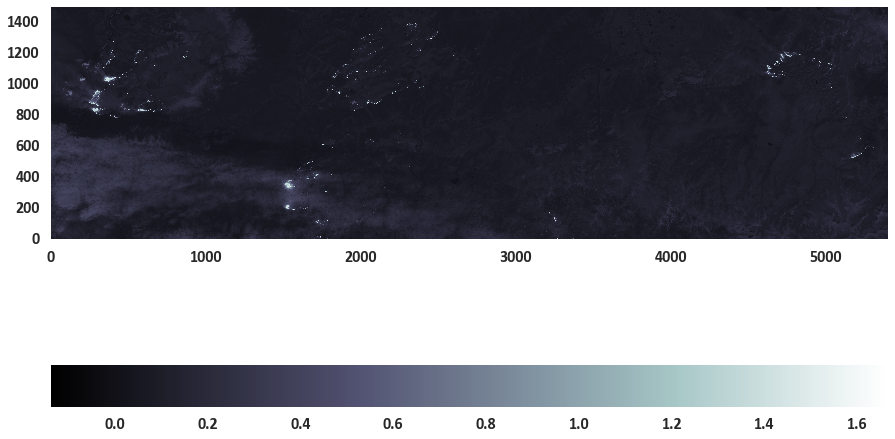

In [107]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho7))
cbar = fig1.colorbar(dataplot, orientation='horizontal')

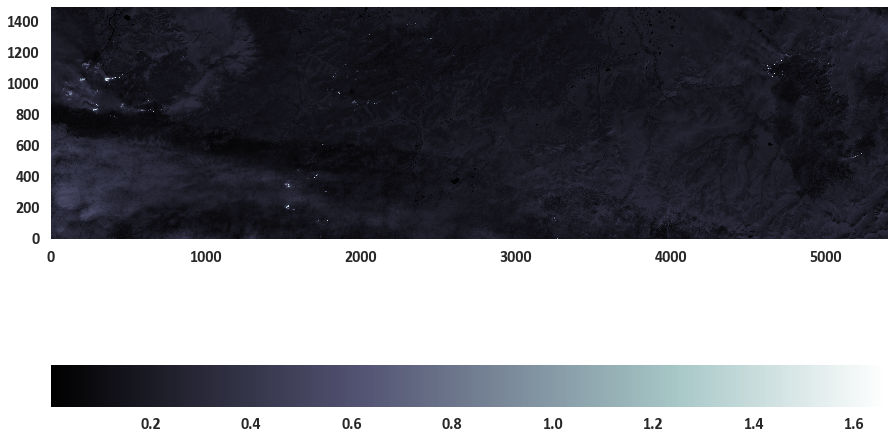

In [67]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho6))
cbar = fig1.colorbar(dataplot, orientation='horizontal')

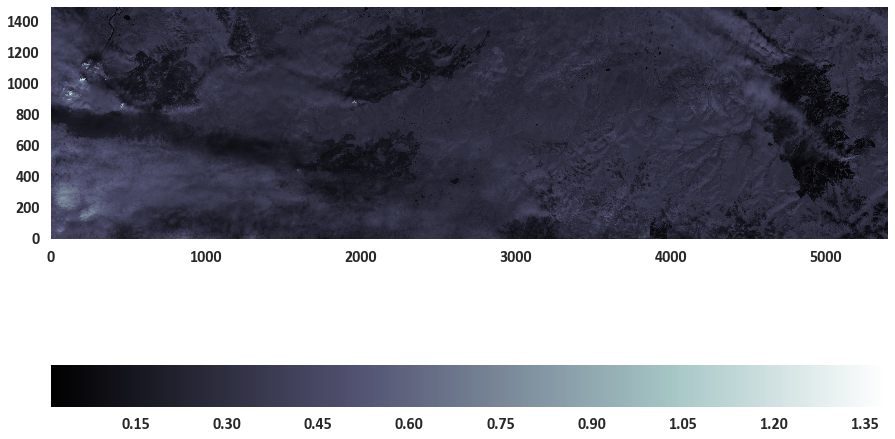

In [68]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho5))
cbar = fig1.colorbar(dataplot, orientation='horizontal')

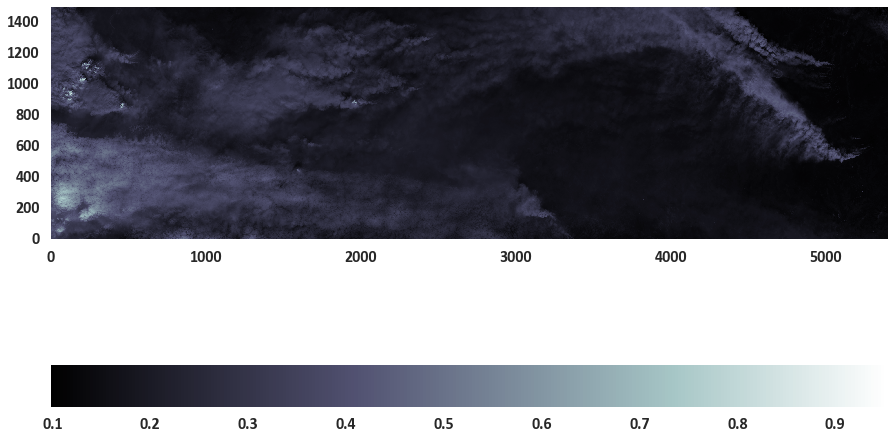

In [69]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho1))
cbar = fig1.colorbar(dataplot, orientation='horizontal')

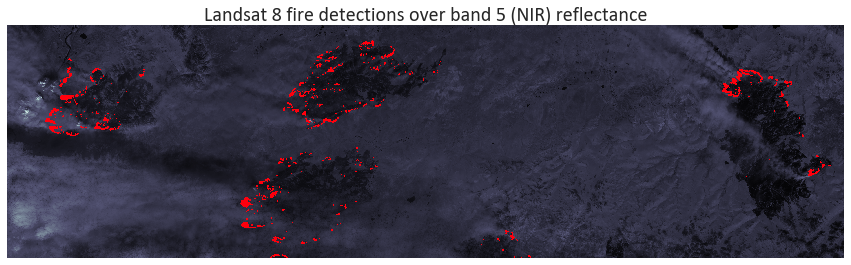

In [14]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.set_title("Landsat 8 fire detections over band 5 (NIR) reflectance")
dataplot = ax1.pcolormesh(np.flipud(rho5))
#maskplot3 = ax1.pcolormesh(np.flipud(firecond3_masked), cmap=cmap3, vmin=0, vmax=1)
#maskplot2 = ax1.pcolormesh(np.flipud(firecond2_masked), cmap=cmap2, vmin=0, vmax=1)
maskplot1 = ax1.pcolormesh(np.flipud(firecond1_masked), cmap=cmap1, vmin=0, vmax=1)

In [71]:
outfn = 'WesternAK_landsatB5_firemask.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=400, bb_inches='tight')

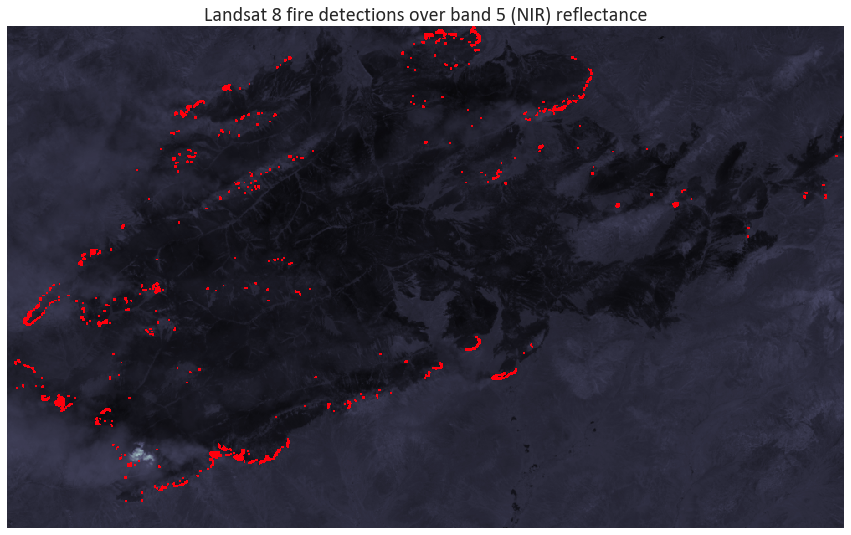

In [28]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((1800, 2800))
ax1.set_ylim((800, 1400))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.set_title("Landsat 8 fire detections over band 5 (NIR) reflectance")
dataplot = ax1.pcolormesh(np.flipud(rho5))
#maskplot3 = ax1.pcolormesh(np.flipud(firecond3_masked), cmap=cmap3, vmin=0, vmax=1)
#maskplot2 = ax1.pcolormesh(np.flipud(firecond2_masked), cmap=cmap2, vmin=0, vmax=1)
maskplot1 = ax1.pcolormesh(np.flipud(firecond1_masked), cmap=cmap1, vmin=0, vmax=1)

In [12]:
landsat.meta['PRODUCT_METADATA']['DATE_ACQUIRED'], landsat.meta['PRODUCT_METADATA']['SCENE_CENTER_TIME']

(datetime.date(2015, 7, 6), datetime.time(21, 36, 48, 604527))

In [34]:
crs = from_string(landsat.band7.proj4)
samplerecords = newviirspolydf[
    (newviirspolydf['DATE'] == '2015-07-06') & 
    (newviirspolydf['GMT'] == '2136')]
firepolygons_h = samplerecords[(samplerecords['Type'] != 'L')]['geometry'].to_crs(crs)
firepolygons_l = samplerecords[(samplerecords['Type'] == 'L')]['geometry'].to_crs(crs)

In [35]:
samplerecords['GMT'].value_counts()

2136    1070
Name: GMT, dtype: int64

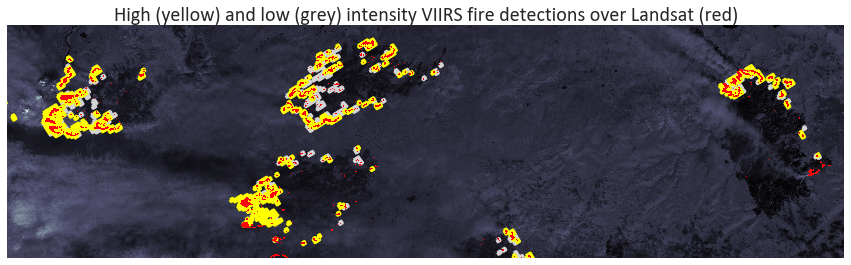

In [77]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat (red)")
dataplot = ax1.pcolormesh(X, Y, rho5)
patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=3) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=3) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))
maskplot1 = ax1.pcolormesh(X, Y, firecond1_masked, cmap=cmap1, vmin=0, vmax=1)


In [78]:
outfn = 'WesternAK_landsat_firemask_footprints.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=300, bb_inches='tight')

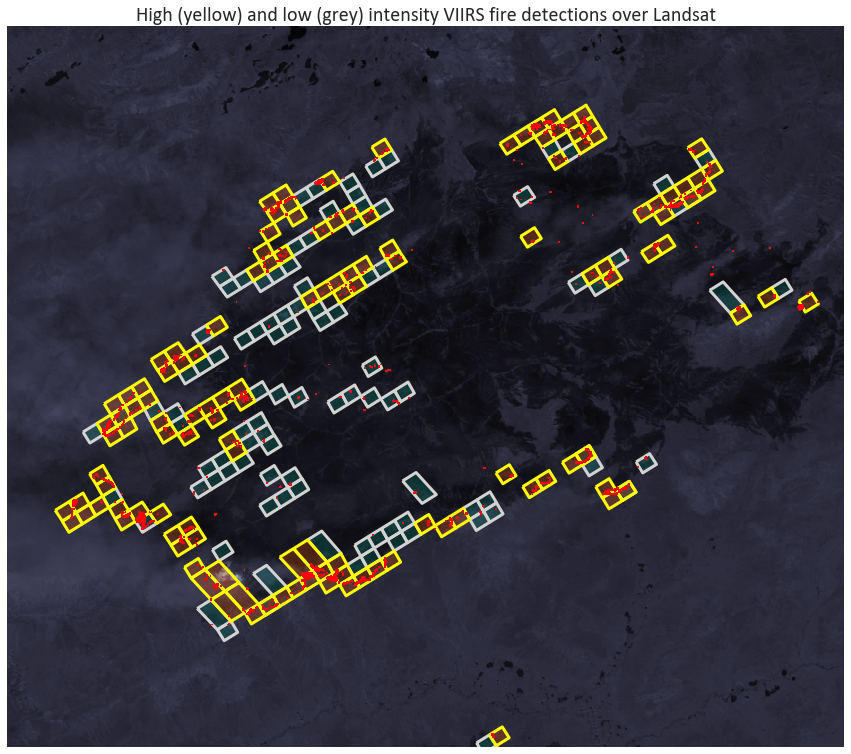

In [75]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((484000, 512000))
ax1.set_ylim((Y[0][0], 7310000))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat")
dataplot = ax1.pcolormesh(X, Y, rho5)
patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=3) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
#patches = [PolygonPatch(poly, color='pink', alpha=0.75) for poly in firepolygons_h]
patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=3) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))
maskplot1 = ax1.pcolormesh(X, Y, firecond1_masked, cmap=cmap1, vmin=0, vmax=1)


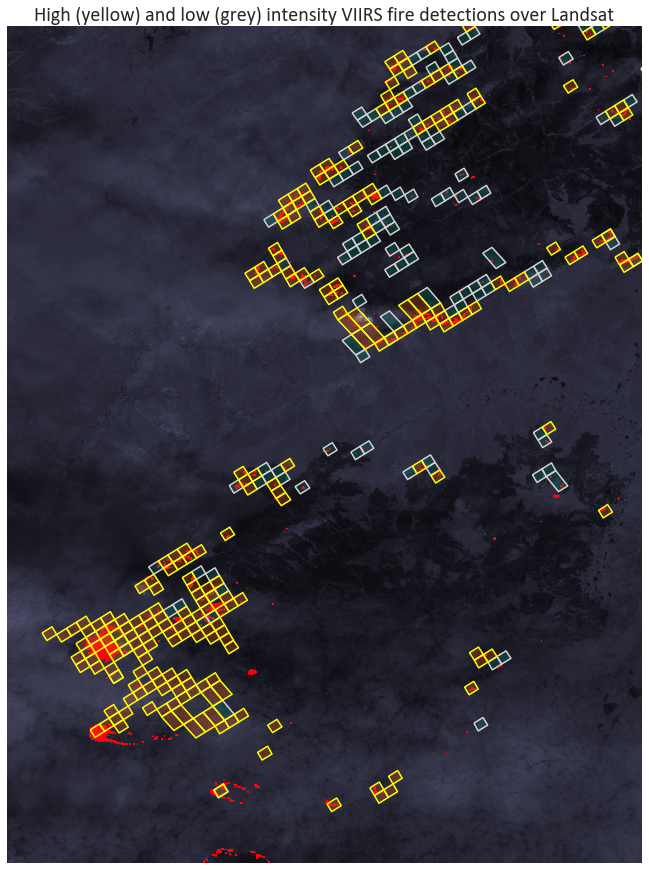

In [86]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((474000, 505000))
ax1.set_ylim((7330000, Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat")
dataplot = ax1.pcolormesh(X, Y, rho5)
maskplot1 = ax1.pcolormesh(X, Y, firecond1_masked, cmap=cmap1, vmin=0, vmax=1)
patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=1.5) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
#patches = [PolygonPatch(poly, color='pink', alpha=0.75) for poly in firepolygons_h]
patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=1.5) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))


In [ ]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((484000, 512000))
ax1.set_ylim((Y[0][0], 7310000))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat")
dataplot = ax1.pcolormesh(X, Y, rho5)
patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=3) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
#patches = [PolygonPatch(poly, color='pink', alpha=0.75) for poly in firepolygons_h]
patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=3) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))
maskplot1 = ax1.pcolormesh(X, Y, firecond1_masked, cmap=cmap1, vmin=0, vmax=1)


In [15]:
samplerecords.to_crs(crs).head()

,AscNode,Bands,DATE,GMT,LAT,LON,Platform,SatZenithA,Sensor,SolZenithA,TB4,TB5,Type,geometry
0,Y,I-Bands,2015-07-06,2136,65.439606,-152.213028,NPP,32.051739,VIIRS,43.211994,367,299.111969,A,"POLYGON ((536154.408941029 7257717.580768922, ..."
1,Y,I-Bands,2015-07-06,2136,65.862053,-151.052811,NPP,27.754086,VIIRS,43.528515,367,310.424713,A,"POLYGON ((588544.0287148765 7305972.16367586, ..."
2,Y,I-Bands,2015-07-06,2136,65.860077,-151.061188,NPP,27.784838,VIIRS,43.527222,367,310.091248,A,"POLYGON ((588162.2074221227 7305736.180906503,..."
3,Y,I-Bands,2015-07-06,2136,65.861252,-151.074448,NPP,27.816086,VIIRS,43.529392,367,305.851166,A,"POLYGON ((587548.8705047569 7305846.269773033,..."
4,Y,I-Bands,2015-07-06,2136,65.861145,-151.046310,NPP,27.721087,VIIRS,43.526558,367,315.152679,A,"POLYGON ((588837.5433225359 7305875.322152918,..."


In [48]:
firehotspots = "/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/activefiremaps.fs.fed.us_data_fireptdata/"
viirsIdir = "viirs_iband_fire_2015_344_ak_shapefile"
viirsIshp = "viirs_iband_fire_2015_344_ak_AKAlbers.shp"
viirsIDF = gp.GeoDataFrame.from_file(os.path.join(firehotspots, viirsIdir, viirsIshp))
ullat = 66.2
ullon = -155.0
lrlat = 65.7
lrlon = -150.0

In [50]:
testviirsDF = viirsIDF[(viirsIDF.LAT < ullat) & (viirsIDF.LAT > lrlat)
        & (viirsIDF.LONG < lrlon) & (viirsIDF.LONG > ullon)]
testviirsDF = testviirsDF.loc[(testviirsDF['DATE'] == '2015-07-06') & (testviirsDF['GMT'] == 2137)]

In [56]:
testviirsDF.shape

(633, 15)

In [51]:
from functools import partial
from shapely.geometry import box

In [52]:
side = 375.0
def makebox(point, a=100.0, b=None):
    if not b: 
        b=a
    return box((point.x)-a/2, point.y-b/2, point.x+a/2, point.y+b/2)

makeboxes = partial(makebox, a=side)

In [53]:
boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs
boxseries.to_crs(crs)

0      POLYGON ((503444.9758830232 7330959.027194868,...
1      POLYGON ((502397.1792240895 7330814.223037968,...
2      POLYGON ((503025.7108004634 7330699.977991374,...
3      POLYGON ((503663.3303873024 7330590.342052966,...
4      POLYGON ((501955.1999480065 7330539.709749373,...
5      POLYGON ((502615.409346931 7330444.342618282, ...
6      POLYGON ((503240.8677707948 7330329.027959623,...
7      POLYGON ((501481.4908236997 7330246.30189913, ...
8      POLYGON ((503887.1635397476 7330225.024899263,...
9      POLYGON ((502182.8841059585 7330177.604591315,...
10     POLYGON ((503459.2440353446 7329960.327355079,...
11     POLYGON ((501009.94381771 7329956.317933248, 5...
12     POLYGON ((496713.097650385 7329823.437320924, ...
13     POLYGON ((507303.1320225709 7329826.943629361,...
14     POLYGON ((502608.1408513904 7329431.130701012,...
15     POLYGON ((496502.4268972724 7329187.244269395,...
16     POLYGON ((507765.9147237423 7329105.857648897,...
17     POLYGON ((507291.6612609

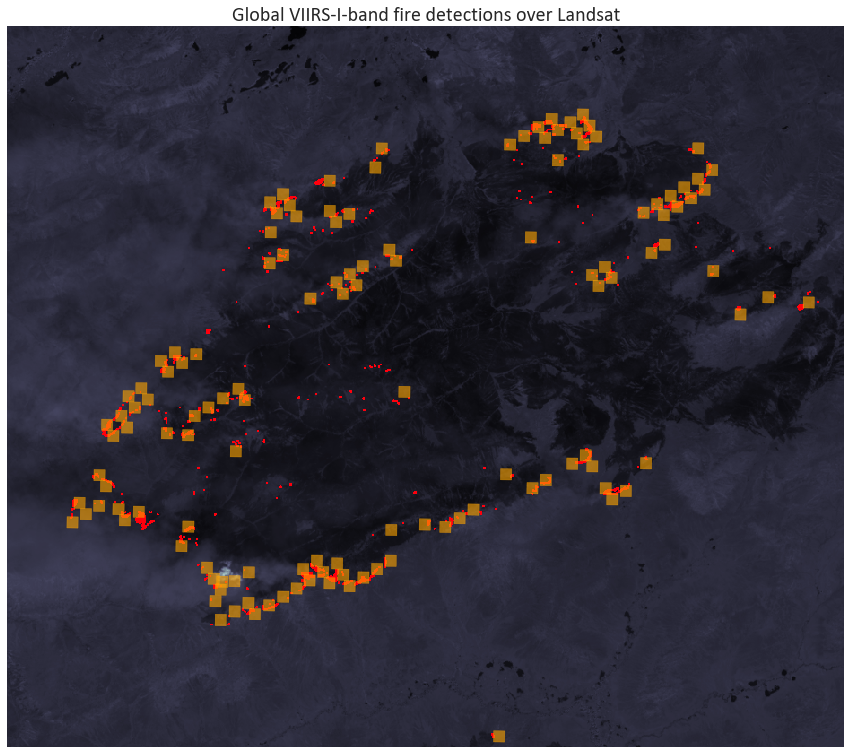

In [59]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((484000, 512000))
ax1.set_ylim((Y[0][0], 7310000))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("Global VIIRS-I-band fire detections over Landsat")
dataplot = ax1.pcolormesh(X, Y, rho5)
maskplot1 = ax1.pcolormesh(X, Y, firecond1_masked, cmap=cmap1, vmin=0, vmax=1)

boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs

patches = [PolygonPatch(poly, color='orange', alpha=0.6) for poly in boxseries.to_crs(crs)]

if patches:
    ax1.add_collection(PatchCollection(patches, match_original=True))


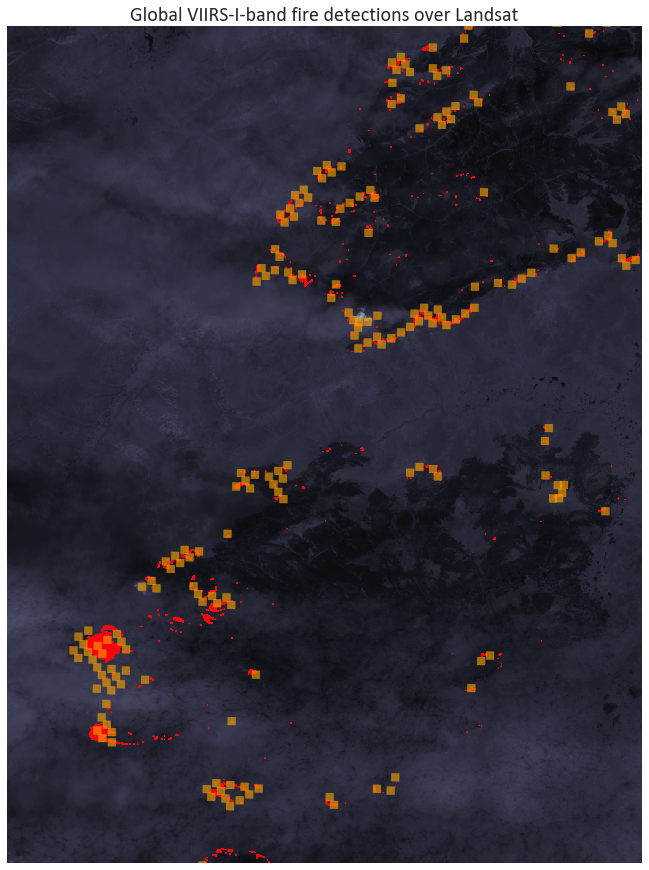

In [87]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((474000, 505000))
ax1.set_ylim((7330000, Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("Global VIIRS-I-band fire detections over Landsat")
dataplot = ax1.pcolormesh(X, Y, rho5)
maskplot1 = ax1.pcolormesh(X, Y, firecond1_masked, cmap=cmap1, vmin=0, vmax=1)

boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs

patches = [PolygonPatch(poly, color='orange', alpha=0.6) for poly in boxseries.to_crs(crs)]

if patches:
    ax1.add_collection(PatchCollection(patches, match_original=True))


In [60]:
outfn = 'WesternAK_landsat_firemask_footprints_global_zoom.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=300, bb_inches='tight')

In [ ]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("Global VIIRS-I-band fire detections over Landsat")
dataplot = ax1.pcolormesh(X, Y, rho5)

boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs

patches = [PolygonPatch(poly, color='orange', alpha=0.6) for poly in boxseries.to_crs(crs)]

if patches:
    ax1.add_collection(PatchCollection(patches, match_original=True))

In [61]:
firecond1idx = (ymax - np.where(firecond1)[0], np.where(firecond1)[1])
firecond1idx

(array([1399, 1399, 1398, ...,    2,    2,    2]),
 array([2356, 2357, 2356, ..., 1701, 1806, 1807]))

In [62]:
ymax

1500

In [63]:
firepoints_h = [Point(lon, lat) 
    for lon, lat in zip(landsat.band7.Lon_pxcenter[firecond1idx], landsat.band7.Lat_pxcenter[firecond1idx])]


In [64]:
samplerecords.loc[samplerecords['Type'] == 'A', 'Type'] = 'H'

In [65]:
samplerecords.head()

,AscNode,Bands,DATE,GMT,LAT,LON,Platform,SatZenithA,Sensor,SolZenithA,TB4,TB5,Type,geometry
0,Y,I-Bands,2015-07-06,2136,65.439606,-152.213028,NPP,32.051739,VIIRS,43.211994,367,299.111969,H,"POLYGON ((-152.2204512415535 65.4400064381251,..."
1,Y,I-Bands,2015-07-06,2136,65.692650,-152.295959,NPP,31.324392,VIIRS,43.464497,367,304.696381,H,POLYGON ((-152.3035277283952 65.69300479589342...
2,Y,I-Bands,2015-07-06,2136,65.061653,-154.906403,NPP,39.144943,VIIRS,43.122398,367,297.381531,H,"POLYGON ((-154.912223626102 65.06252300142859,..."
3,Y,I-Bands,2015-07-06,2136,65.059784,-154.913071,NPP,39.166157,VIIRS,43.121391,367,308.652161,H,POLYGON ((-154.9187696432708 65.06068812735624...
4,Y,I-Bands,2015-07-06,2136,66.027336,-151.228851,NPP,27.561676,VIIRS,43.703262,367,301.670776,H,POLYGON ((-151.2358625945558 66.02783600540627...


In [68]:
samplerecords['pointcount'] = 0

In [69]:
for idx, record in samplerecords.iterrows():
    poly = record['geometry']
    for pt in firepoints_h:
        if pt.within(poly):
            samplerecords.loc[idx, 'pointcount'] += 1

In [70]:
samplerecords.groupby('Type').describe()

LAT         LON  SatZenithA  SolZenithA         TB4  \
Type                                                                     
H    count  745.000000  745.000000  745.000000  745.000000  745.000000   
     mean    65.834633 -153.607845   33.690212   43.730144  338.383590   
     std      0.326204    1.054072    2.847875    0.299587   24.830054   
     min     64.709953 -155.579575   27.374468   42.767708  208.000000   
     25%     65.819984 -154.460938   32.113598   43.684917  332.738098   
     50%     65.961693 -153.471786   33.563889   43.846535  341.077911   
     75%     65.998436 -153.114853   35.354561   43.929310  349.839905   
     max     66.100822 -151.036606   40.817661   44.006180  367.000000   
L    count  325.000000  325.000000  325.000000  325.000000  325.000000   
     mean    65.877172 -153.426159   33.145075   43.753043  330.397343   
     std      0.317985    1.010560    2.800138    0.285805   14.278500   
     min     64.707809 -155.439621   27.405952   42.771118  320.013611   
     25%     65.911842 -154.238037   31.887428   43.704784  321.801941   
     50%     65.978966 -153.218948   32.488918   43.852253  324.604523   
     75%     66.013771 -153.047745   34.619213   43.911842  329.692871   
     max     66.090477 -151.032349   40.771576   43.995590  367.000000   

                   TB5  pointcount  
Type                                
H    count  745.000000  745.000000  
     mean   298.179690   12.524832  
     std      9.432137   30.656872  
     min    278.480164    0.000000  
     25%    293.538086    0.000000  
     50%    297.093719    1.000000  
     75%    301.123199   12.000000  
     max    365.854675  273.000000  
L    count  325.000000  325.000000  
     mean   300.048425    8.483077  
     std      6.296864   23.980133  
     min    286.307495    0.000000  
     25%    296.328552    0.000000  
     50%    298.841675    0.000000  
     75%    302.049835    4.000000  
     max    323.882080  220.000000

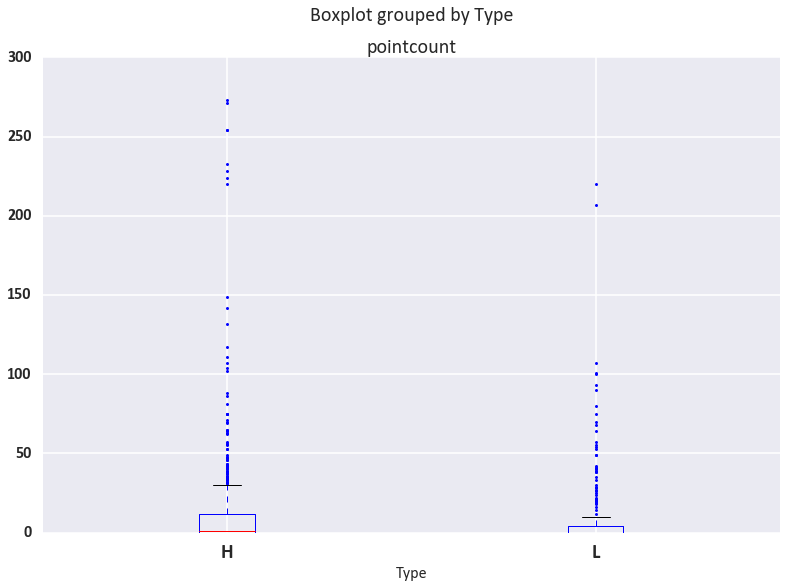

In [71]:
samplerecords[['pointcount', 'Type']].boxplot(column='pointcount', by='Type', sym='k.')
#ax = plt.gca()
#ax.set_ylim(-2, 57)


(-2, 32)

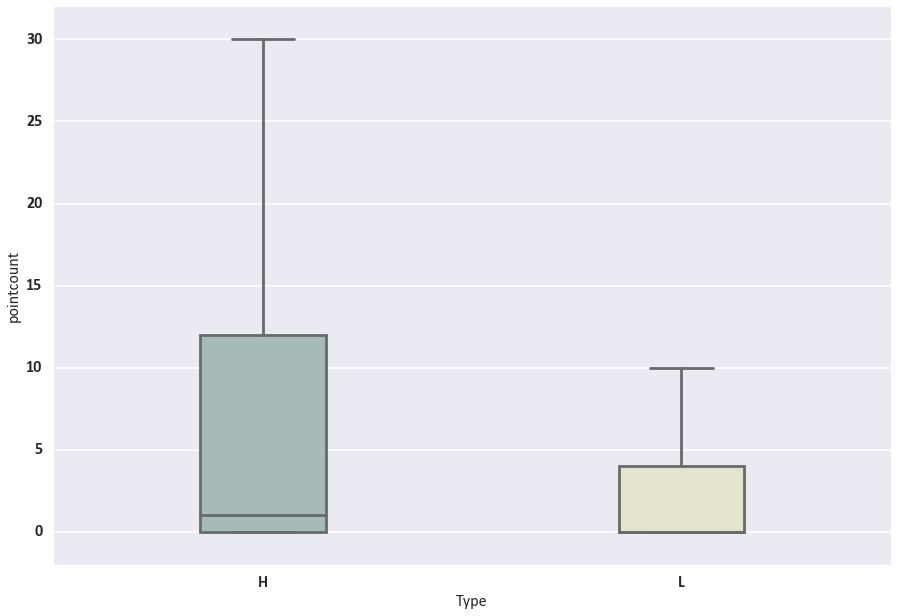

In [73]:
fig2 = plt.figure(1, figsize=(15, 10))
ax2 = fig2.add_subplot(111)
sns.boxplot(x='Type', y='pointcount', data=samplerecords, showfliers=False,
    palette="Set3", saturation=0.3, width=.3, ax=ax2)
#sns.swarmplot(
#    x='Type', y='pointcount', data=samplerecords, color=".25", size=10, ax=ax2)
ax2.set_ylim(-2, 32)

In [74]:
outfn = 'WesternAK_landsat_firematch_boxplot.png'
fig2.savefig(os.path.join(productdir, outfn), dpi=200, bb_inches='tight')

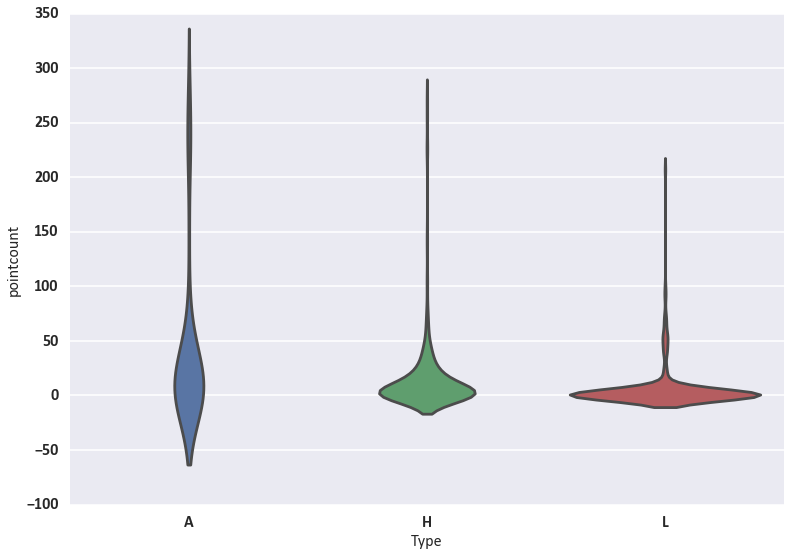

In [86]:
ax = sns.violinplot(x='Type', y='pointcount', data=samplerecords, inner=None)

### Look into NBR

In [87]:
NBR = landsat.NBR

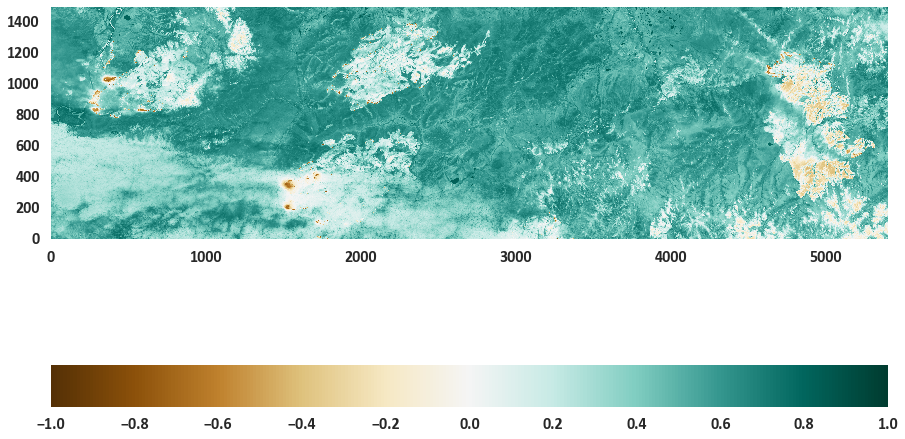

In [89]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(NBR), cmap='BrBG', vmin=-1., vmax=1.)
cbar = fig1.colorbar(dataplot, orientation='horizontal')

In [32]:
scene_before = 'LC80700172015150LGN00'
scene_after = 'LC80700172015214LGN00'
landsat_before = raster.Landsatscene(os.path.join(landsatpath, scene_before))
landsat_after = raster.Landsatscene(os.path.join(landsatpath, scene_after))
landsat_before.infix = '_clip'
landsat_after.infix = '_clip'

ERROR! Session/line number was not unique in database. History logging moved to new session 106


In [33]:
NBR_before = landsat_before.NBR
NBR_after = landsat_after.NBR

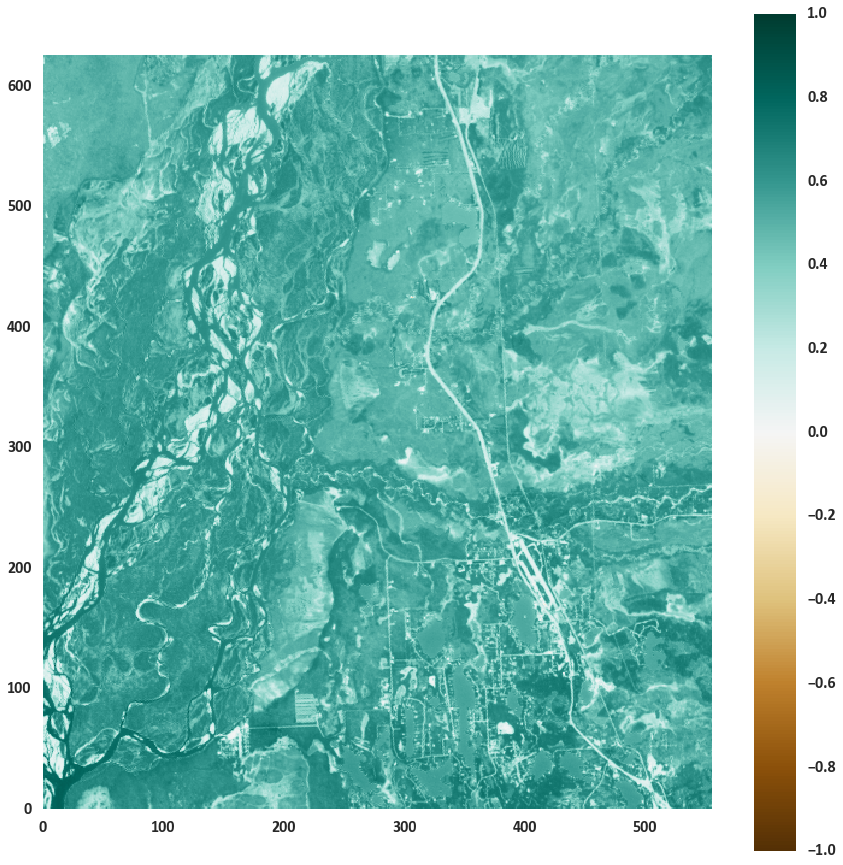

In [38]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(NBR_before), cmap='BrBG', vmin=-1., vmax=1.)
cbar = fig1.colorbar(dataplot)

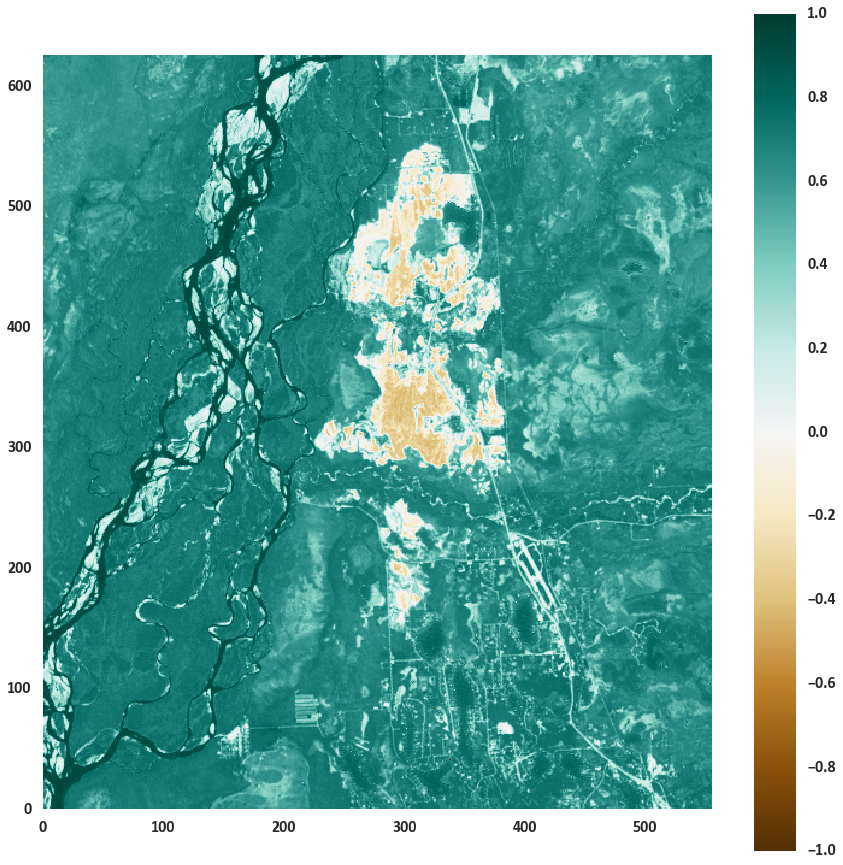

In [37]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(NBR_after), cmap='BrBG', vmin=-1., vmax=1.)
cbar = fig1.colorbar(dataplot)

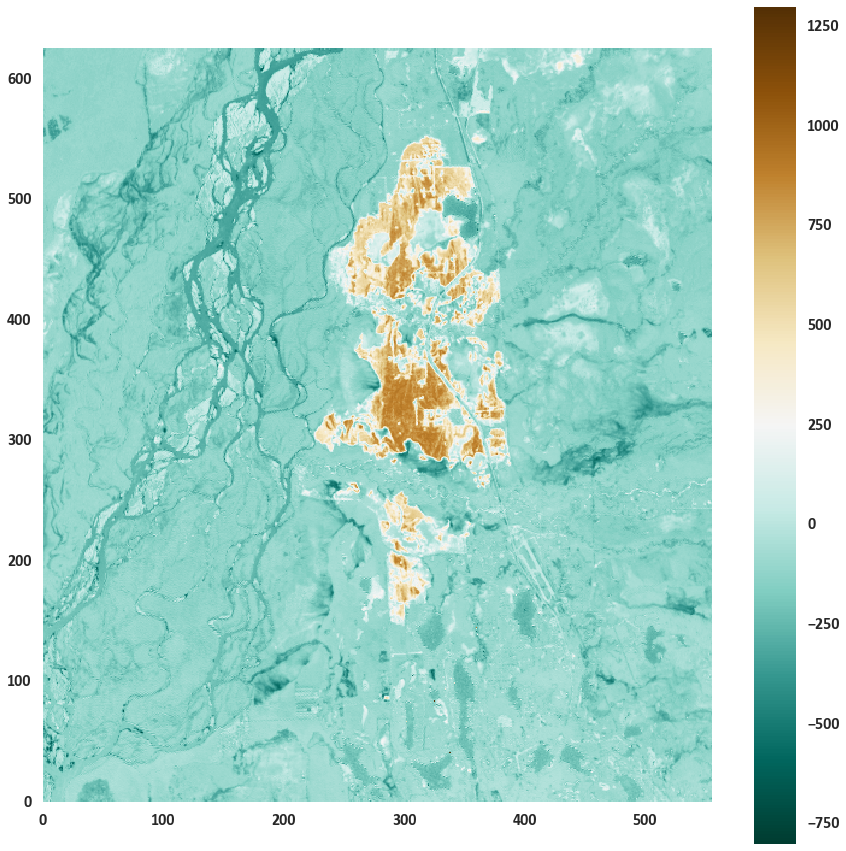

In [44]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(NBR_before - NBR_after)*1000, cmap='BrBG_r', vmin=-800., vmax=1300.)
cbar = fig1.colorbar(dataplot)

In [45]:
crs = from_string(landsat_after.band7.proj4)
firepolygons = newviirspolydf['geometry'].to_crs(crs)

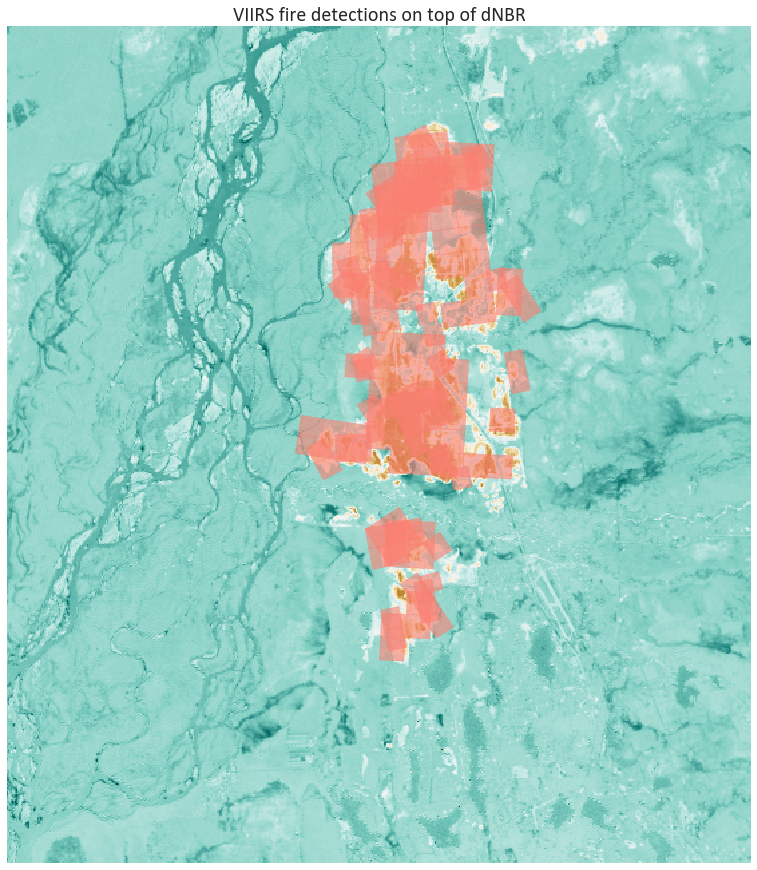

In [67]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat_after.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("VIIRS fire detections on top of dNBR")
dataplot = ax1.pcolormesh(X, Y, (NBR_before - NBR_after)*1000, cmap='BrBG_r', vmin=-800., vmax=1300.)
patches = [PolygonPatch(poly, color='salmon', alpha=0.6) for poly in firepolygons]
ax1.add_collection(PatchCollection(patches, match_original=True))

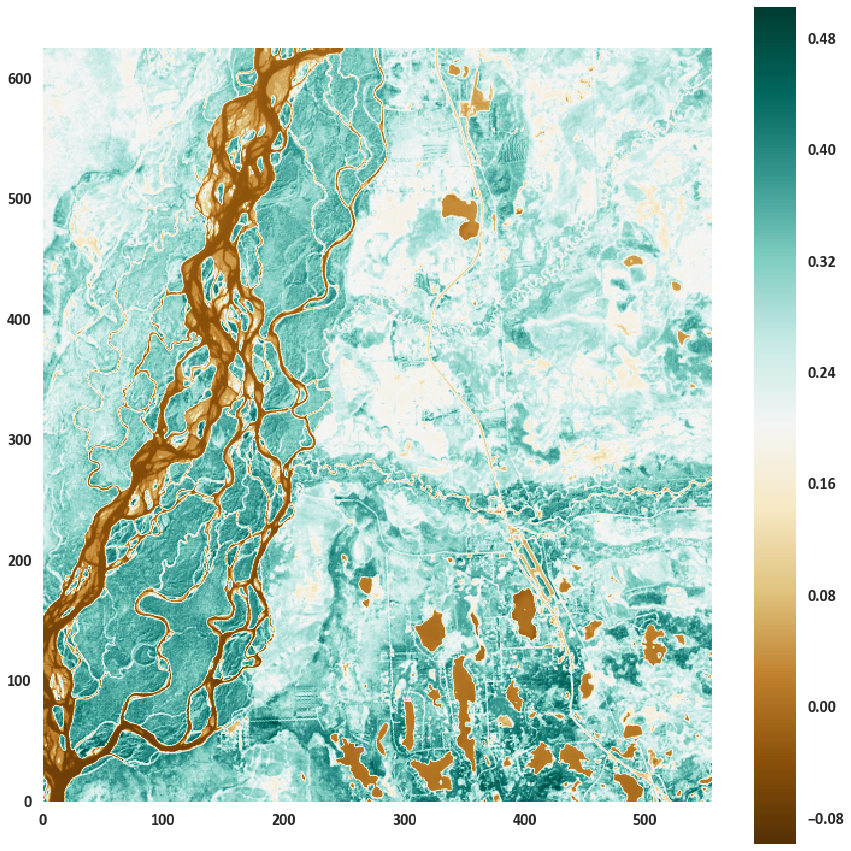

In [66]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(landsat_before.NDVI), cmap='BrBG')
cbar = fig1.colorbar(dataplot)